#Importing file

In [0]:
import pandas as pd

ranked_df = pd.read_csv("/Workspace/Shared/ranked_df.csv")
display(ranked_df)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Degree Centrality,Normalized Degree Centrality,Normalized Eigenvector Centrality,Normalized Closeness Centrality,Rank by Degree Centrality,Rank by Closeness Centrality,Rank by Betweenness Centrality,Rank by Eigenvector Centrality
114332,Rail,M,PDEL-RAIL-OPML,"Operations Manager NSW, QLD & New Zealand",Rail New Zealand,0.0,0.022113140990345,0.712402870847445,0.0031688546853779,0.35,1.0,0.9601786384504324,14,2,87,1
59536,Infrastructure,M,PDEL-INFR-GEMO,General Manager Infrastructure NSW/ACT/QLD,Infrastructure NSW/ACT,0.0,0.0192345416285235,0.6040912326694563,0.0036215482118605,0.4,0.8479629397766254,0.8351864622107537,12,3,87,2
54703,Major Projects,M,PDEL-INFR-PRD1B,Project Director,M7-M12 Project,0.0,0.0124101034613957,0.2918974353492506,0.0015844273426889,0.175,0.4097364669525624,0.538861315531548,21,14,87,3
22510,Rail,M,PDEL-RAIL-PRD,Alliance General Manager,North Western Program Alliance - R,0.0,0.0139593694019078,0.1712292422075994,0.0011317338162064,0.125,0.2403545089622775,0.6061322682201803,23,7,87,4
62061,Building,M,PDEL-BUILD-GEMB,General Manager Building NSW/ACT,Building NSW/ACT Operations,0.0,0.0100420597124706,0.0776221090810132,9.053870529651E-4,0.1,0.1089581643412389,0.4360380656084951,24,22,87,5
90346,Building,M,PDEL-BUILD-GEMB,General Manager Building QLD/NT,Building QLD/NT Operations,0.0,0.0118384162481703,0.0670372393242477,0.0024898143956541,0.275,0.0941001813235563,0.5140379830952417,17,17,87,6
92139,Infrastructure,M,PDEL-INFR-PRD,Project Director,Upper South Creek Advanced Water Recycling Centre,6.277463263825654E-6,0.0083555952222497,0.0308222876423316,0.0018107741059302,0.2,0.0432652490626111,0.3628097902258949,20,28,12,7
110476,Rail,M,PDEL-RAIL-PRD,Project Director,Gold Coast Light Rail Stage 3,1.0207257339553908E-5,0.0125144933476082,0.0304814327532192,0.0024898143956541,0.275,0.0427867910116096,0.5433940473969697,17,13,2,8
94457,Infrastructure,M,PDEL-INFR-GEMO,General Manager Infrastructure VIC/SA/TAS,Infrastructure VIC/SA/TAS,0.0,0.0157453544878515,0.0150310999322774,0.0049796287913082,0.55,0.0210991568747447,0.6836818451374974,7,5,87,9
88714,Major Projects,M,PDEL-INFR-CD1B,Construction Director,M7-M12 Project,4.49119322940372E-6,0.005716555125928,0.013952121575125,0.0015844273426889,0.175,0.0195845948182044,0.2482195595748709,21,36,20,10


In [0]:
from pyspark.sql.functions import to_date

csv_file_path = "/Volumes/studentproject_01_exploration/studentproject_01_schema/files/Job History 1.csv"

# Set the legacy time parser policy
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

# Read the CSV file into a Spark DataFrame
df_spark = spark.read.option("header", "true").csv(csv_file_path)

# Convert "Reporting Date" to date type
df_spark = df_spark.withColumn("Reporting Date", to_date(df_spark["Reporting Date"], "dd-MMM-yy"))

# Filter the DataFrame to only include rows where the "Employee Status" is "Active" and "Reporting Date" is "2024-04-01"
filtered_df_spark = df_spark.filter(
    (df_spark["Employee Status"] == "Active") & 
    (df_spark["Reporting Date"] == "2024-04-01")
)

# # Display the Spark DataFrame
# display(filtered_df_spark)

In [0]:
ranked_df = spark.createDataFrame(ranked_df)

In [0]:
# Perform the join operation directly with Spark DataFrames
joined_df = filtered_df_spark.join(ranked_df, filtered_df_spark["Person ID"] == ranked_df["Person ID"], "inner") \
    .select(
        ranked_df["*"], 
        filtered_df_spark["Job Level"],
        filtered_df_spark["Age (Group)"],
        filtered_df_spark["Generation"],
    )

# Display the result
display(joined_df)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Degree Centrality,Normalized Degree Centrality,Normalized Eigenvector Centrality,Normalized Closeness Centrality,Rank by Degree Centrality,Rank by Closeness Centrality,Rank by Betweenness Centrality,Rank by Eigenvector Centrality,Job Level,Age (Group),Generation
10390,Rail,M,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,5,50 and more,Baby Bommer
10833,Infrastructure,M,TAL-CONSTR-SUP,Supervisor,Bruce Highway Edmonton to Gordonvale,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,5,40-50 yrs,Millenial
11586,Rail,M,TAL-TRACK-TRACKSUP,Track Supervisor,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,5,40-50 yrs,Millenial
11587,Rail,M,TAL-TRACK-RAILSPT,Track Superintendent,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,6,40-50 yrs,Millenial
12182,Rail,M,TAL-TRACK-TRACKSUP,Track Supervisor,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,5,30-40 yrs,Millenial
12189,Rail,M,TAL-TRACK-RAILSPT,Track Superintendent,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,6,40-50 yrs,Gen X
12276,Rail,M,TAL-CONSTR-SUPEN,Night Shift Supervisor,PTA Urban Rail Infrastructure,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,4,40-50 yrs,Millenial
12355,Rail,M,PDEL-RAIL-PMRSIG,Project Manager - Signalling & Comms Installation Manager,Metro Tunnel Rail Network Alliance,6.124354403732346E-7,0.0010164897221594,3.9118449196823214E-8,0.0011317338162064,0.125,5.4907347557242996E-8,0.0441371814998188,23,181,75,221,6,30-40 yrs,Millenial
14334,Rail,M,TAL-ELEC-OHWSUPINT,Electrical & OHW Superintendent,RIS VIC - OHW,6.124354403732346E-7,9.035464196973E-4,1.1876351068622723E-9,0.0011317338162064,0.125,1.6638590168861541E-9,0.0392330502220612,23,186,75,253,6,40-50 yrs,Millenial
14775,Major Projects,M,QUAL-QUAL-SQA,Quality and Completions Manager,Kidston Pumped Storage Hydro,2.0414514679107817E-7,4.517732098486E-4,5.949661367066313E-10,6.790402897238E-4,0.075,8.319295084430765E-10,0.0196165251110306,25,201,83,255,5,50 and more,Gen X


In [0]:
from pyspark.sql.functions import col

# Reorder columns to place "Job Level" after "Gender"
reordered_columns = ["Person ID", "BU", "Gender", "Job Level", "Age (Group)", "Generation"] + [col for col in joined_df.columns if col not in ["Person ID", "BU", "Gender", "Job Level"]]
joined_df = joined_df.select(reordered_columns)

display(joined_df)

Person ID,BU,Gender,Job Level,Age (Group),Generation,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Degree Centrality,Normalized Degree Centrality,Normalized Eigenvector Centrality,Normalized Closeness Centrality,Rank by Degree Centrality,Rank by Closeness Centrality,Rank by Betweenness Centrality,Rank by Eigenvector Centrality,Age (Group),Generation
10390,Rail,M,5,50 and more,Baby Bommer,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,50 and more,Baby Bommer
10833,Infrastructure,M,5,40-50 yrs,Millenial,TAL-CONSTR-SUP,Supervisor,Bruce Highway Edmonton to Gordonvale,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Millenial
11586,Rail,M,5,40-50 yrs,Millenial,TAL-TRACK-TRACKSUP,Track Supervisor,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Millenial
11587,Rail,M,6,40-50 yrs,Millenial,TAL-TRACK-RAILSPT,Track Superintendent,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Millenial
12182,Rail,M,5,30-40 yrs,Millenial,TAL-TRACK-TRACKSUP,Track Supervisor,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,30-40 yrs,Millenial
12189,Rail,M,6,40-50 yrs,Gen X,TAL-TRACK-RAILSPT,Track Superintendent,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Gen X
12276,Rail,M,4,40-50 yrs,Millenial,TAL-CONSTR-SUPEN,Night Shift Supervisor,PTA Urban Rail Infrastructure,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Millenial
12355,Rail,M,6,30-40 yrs,Millenial,PDEL-RAIL-PMRSIG,Project Manager - Signalling & Comms Installation Manager,Metro Tunnel Rail Network Alliance,6.124354403732346E-7,0.0010164897221594,3.9118449196823214E-8,0.0011317338162064,0.125,5.4907347557242996E-8,0.0441371814998188,23,181,75,221,30-40 yrs,Millenial
14334,Rail,M,6,40-50 yrs,Millenial,TAL-ELEC-OHWSUPINT,Electrical & OHW Superintendent,RIS VIC - OHW,6.124354403732346E-7,9.035464196973E-4,1.1876351068622723E-9,0.0011317338162064,0.125,1.6638590168861541E-9,0.0392330502220612,23,186,75,253,40-50 yrs,Millenial
14775,Major Projects,M,5,50 and more,Gen X,QUAL-QUAL-SQA,Quality and Completions Manager,Kidston Pumped Storage Hydro,2.0414514679107817E-7,4.517732098486E-4,5.949661367066313E-10,6.790402897238E-4,0.075,8.319295084430765E-10,0.0196165251110306,25,201,83,255,50 and more,Gen X


In [0]:
from pyspark.sql.functions import when, col

# Update Gender column: If not 'M' or 'F', mark as 'O'
joined_df = joined_df.withColumn(
    "Gender", 
    when(col("Gender").isin("M", "F"), col("Gender")).otherwise("O")
)

# Display updated DataFrame
display(joined_df)

Person ID,BU,Gender,Job Level,Age (Group),Generation,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Degree Centrality,Normalized Degree Centrality,Normalized Eigenvector Centrality,Normalized Closeness Centrality,Rank by Degree Centrality,Rank by Closeness Centrality,Rank by Betweenness Centrality,Rank by Eigenvector Centrality,Age (Group),Generation
10390,Rail,M,5,50 and more,Baby Bommer,PCON-PLAN-SPLAN,Senior Planner,Metro Tunnel Rail Network Alliance,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,50 and more,Baby Bommer
10833,Infrastructure,M,5,40-50 yrs,Millenial,TAL-CONSTR-SUP,Supervisor,Bruce Highway Edmonton to Gordonvale,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Millenial
11586,Rail,M,5,40-50 yrs,Millenial,TAL-TRACK-TRACKSUP,Track Supervisor,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Millenial
11587,Rail,M,6,40-50 yrs,Millenial,TAL-TRACK-RAILSPT,Track Superintendent,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Millenial
12182,Rail,M,5,30-40 yrs,Millenial,TAL-TRACK-TRACKSUP,Track Supervisor,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,30-40 yrs,Millenial
12189,Rail,M,6,40-50 yrs,Gen X,TAL-TRACK-RAILSPT,Track Superintendent,RIS VIC - Track & Civil,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Gen X
12276,Rail,M,4,40-50 yrs,Millenial,TAL-CONSTR-SUPEN,Night Shift Supervisor,PTA Urban Rail Infrastructure,0.0,0.0,2.2971665509908546E-12,2.263467632412E-4,0.025,0.0,0.0,27,206,87,257,40-50 yrs,Millenial
12355,Rail,M,6,30-40 yrs,Millenial,PDEL-RAIL-PMRSIG,Project Manager - Signalling & Comms Installation Manager,Metro Tunnel Rail Network Alliance,6.124354403732346E-7,0.0010164897221594,3.9118449196823214E-8,0.0011317338162064,0.125,5.4907347557242996E-8,0.0441371814998188,23,181,75,221,30-40 yrs,Millenial
14334,Rail,M,6,40-50 yrs,Millenial,TAL-ELEC-OHWSUPINT,Electrical & OHW Superintendent,RIS VIC - OHW,6.124354403732346E-7,9.035464196973E-4,1.1876351068622723E-9,0.0011317338162064,0.125,1.6638590168861541E-9,0.0392330502220612,23,186,75,253,40-50 yrs,Millenial
14775,Major Projects,M,5,50 and more,Gen X,QUAL-QUAL-SQA,Quality and Completions Manager,Kidston Pumped Storage Hydro,2.0414514679107817E-7,4.517732098486E-4,5.949661367066313E-10,6.790402897238E-4,0.075,8.319295084430765E-10,0.0196165251110306,25,201,83,255,50 and more,Gen X


##BU wise metric analysis


In [0]:
joined_df.columns

['Person ID',
 'BU',
 'Gender',
 'Job Level',
 'Age (Group)',
 'Generation',
 'JH Position Title (externalCode)',
 'External Title',
 'Department',
 'Betweenness Centrality',
 'Closeness Centrality',
 'Eigenvector Centrality',
 'Degree Centrality',
 'Normalized Degree Centrality',
 'Normalized Eigenvector Centrality',
 'Normalized Closeness Centrality',
 'Rank by Degree Centrality',
 'Rank by Closeness Centrality',
 'Rank by Betweenness Centrality',
 'Rank by Eigenvector Centrality',
 'Age (Group)',
 'Generation']

In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# Function to get top 100 employees based on centrality metric
def get_top_100_by_metric(df, metric_col):
    window_spec = Window.partitionBy('BU').orderBy(F.desc(metric_col))
    
    # Add a rank column based on the centrality metric
    df_with_rank = df.withColumn('rank', F.row_number().over(window_spec))
    
    # Filter for the top 100 employees for each BU
    top_100_df = df_with_rank.filter(df_with_rank['rank'] <= 100)
    
    return top_100_df

# Example usage: Get top 100 by Degree Centrality
top_100_by_degree = get_top_100_by_metric(joined_df, 'Betweenness Centrality')


In [0]:
display(top_100_by_degree)

Person ID,BU,Gender,Job Level,Age (Group),Generation,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Degree Centrality,Normalized Degree Centrality,Normalized Eigenvector Centrality,Normalized Closeness Centrality,Rank by Degree Centrality,Rank by Closeness Centrality,Rank by Betweenness Centrality,Rank by Eigenvector Centrality,Age (Group),Generation,rank
120484,Building,M,7,40-50 yrs,Millenial,PDEL-BUILD-OPMB,Operations Manager,Building NSW/ACT Operations,8.012697011549818E-6,0.0127120523396798,0.0035319511667082,0.0036215482118605,0.4,0.0049578002966509,0.5519722916230518,12,11,4,13,40-50 yrs,Millenial,1
123337,Building,M,7,50 and more,Baby Bommer,PDEL-BUILD-PRDB,Project Director,CEP Office,7.85958815145651E-6,0.0083705105037271,7.117134702543851E-5,0.0054323223177908,0.6000000000000001,9.99032256058134E-5,0.3634574293228139,6,27,6,42,50 and more,Baby Bommer,2
126504,Building,M,8,40-50 yrs,Gen X,PDEL-INFR-OMLBU,Operations Manager,Building QLD/NT Operations,7.349225284478814E-6,0.0111258542510946,0.0029990941514643,0.0022634676324128,0.25,0.00420982883689,0.4830977015467109,18,18,8,16,40-50 yrs,Gen X,3
117515,Building,F,7,40-50 yrs,Millenial,PDEL-BUILD-PRDB,Project Director,Sydney Children's Hospital,6.838862417501119E-6,0.005895377729682,1.296995809478E-4,0.0013580805794477,0.15,1.820593149727E-4,0.2559842477424895,22,34,10,35,40-50 yrs,Millenial,4
80991,Building,M,7,40-50 yrs,Gen X,PDEL-BUILD-SPMB,Senior Project Manager,Sydney Children's Hospital,4.4401569427059504E-6,0.0033923327632385,3.5735986308816743E-6,0.0015844273426889,0.175,5.016257626075599E-6,0.1472990858783637,21,71,21,80,40-50 yrs,Gen X,5
84480,Building,M,7,40-50 yrs,Gen X,PDEL-BUILD-SPMB,Senior Project Manager,CEP Office,3.674612642239407E-6,0.0033361713958054,1.0523848318395835E-6,0.0024898143956541,0.275,1.477229497158757E-6,0.1448604931276106,17,73,27,112,40-50 yrs,Gen X,6
124810,Building,M,6,30-40 yrs,Millenial,PDEL-BUILD-PRMB,Project Manager,Shoalhaven Hospital Redevelopment,3.36839492205279E-6,0.0028770820206151,3.052268167967053E-7,0.0015844273426889,0.175,4.284436968481837E-7,0.1249262914965633,21,93,30,132,30-40 yrs,Millenial,7
98878,Building,M,7,40-50 yrs,Millenial,PDEL-BUILD-PRDB,Project Director,Queensland Train Manufacturing Program,3.2663223486572507E-6,0.0041304979186162,5.81418367255508E-6,0.0036215482118605,0.4,8.16136713274466E-6,0.1793510867294226,12,56,31,74,40-50 yrs,Millenial,8
85305,Building,M,6,30-40 yrs,Millenial,PDEL-BUILD-PRMB,Project Manager,Waterloo Integrated Station Development - Southern Precinct,2.9601046284706336E-6,0.0051343414794962,1.5794857771303033E-7,0.0049796287913082,0.55,2.2170921400008158E-7,0.222939157005091,7,43,35,146,30-40 yrs,Millenial,9
118372,Building,M,6,30-40 yrs,Millenial,PDEL-BUILD-PRMB,Project Manager,Mater Hospital Springfield - Stage 2,2.909068341772864E-6,0.0026304859476671,9.948959417344877E-7,0.0020371208691715,0.225,1.39653233483978E-6,0.1142187994368072,19,105,36,114,30-40 yrs,Millenial,10


In [0]:
from pyspark.sql import functions as F
from pyspark.sql.window import Window

# Function to get top 5 employees for each BU from the given dataframe
def get_top_5_by_bu(df):
    window_spec = Window.partitionBy('BU').orderBy(F.desc('Rank by Degree Centrality'))
    
    # Add a rank column based on the degree centrality metric
    df_with_rank = df.withColumn('rank', F.row_number().over(window_spec))
    
    # Filter for the top 5 employees for each BU
    top_5_df = df_with_rank.filter(df_with_rank['rank'] <= 5)
    
    # Select the required columns
    top_5_by_bu = top_5_df.select("Person ID", "BU", "Gender","Job Level","Age (Group)", "Generation", "External Title", "Department")
    
    return top_5_by_bu

# Example usage: Get top 5 employees for each BU from top_100_by_degree dataframe
top_5_by_bu = get_top_5_by_bu(top_100_by_degree)

# Display the result
display(top_5_by_bu)

Person ID,BU,Gender,Job Level,Age (Group),Generation,External Title,Department
122878,Building,M,5,30-40 yrs,Millenial,Senior Project Engineer,Sydney Children's Hospital
95327,Building,M,6,40-50 yrs,Millenial,Commercial Manager,Ballarat Base Hospital Redevelopment - Stage 2
119071,Building,M,4,20-30 yrs,Gen Z,Project Engineer,Toowoomba Hospital
118359,Building,F,4,30-40 yrs,Millenial,Project Engineer,Sydney Children's Hospital
123374,Building,M,5,30-40 yrs,Millenial,Senior Contracts Administrator,Logan Hospital Expansion Project
59408,Corporate,F,4,30-40 yrs,Millenial,Senior Resourcing Advisor Rail,Talent
60181,Corporate,M,6,50 and more,Gen X,Industrial Relations Manager NSW/ACT/NZ,Industrial Relations
118469,Corporate,M,5,50 and more,Gen X,IT Principal Integration Engineer,Applications & Emerging Technology
119505,Corporate,F,4,40-50 yrs,Millenial,Senior Analyst,People Planning & Enablement
36218,Corporate,F,3,40-50 yrs,Millenial,Claims Manager,Insurance


In [0]:
display(top_100_by_degree.filter(F.col('BU') == 'Rail').select("Person ID", "BU", "Gender", "External Title").limit(5))

Person ID,BU,Gender,External Title
114332,Rail,M,"Operations Manager NSW, QLD & New Zealand"
22510,Rail,M,Alliance General Manager
110476,Rail,M,Project Director
60553,Rail,M,General Manager Rail Services
114051,Rail,M,General Manager Delivery


In [0]:
from pyspark.sql.functions import col, count

# Step 1: Filter top 100 employees by Rank by Degree Centrality
top_100_df = joined_df.filter(col("Rank by Degree Centrality") <= 100)

# Step 2: Group by BU and Gender, and count the number of people in each group
gender_split_degree = (
    top_100_df.groupBy("BU", "Gender")
    .agg(count("Person ID").alias("count"))  # Count the number of Person IDs per Gender per BU
)

# Step 3: Display the result
display(gender_split_degree)


BU,Gender,count
Corporate,M,199
Corporate,O,1
TEK,O,1
Major Projects,F,305
Infrastructure,F,425
Rail,O,5
TEK,F,23
Corporate,F,223
Building,F,169
Infrastructure,M,887


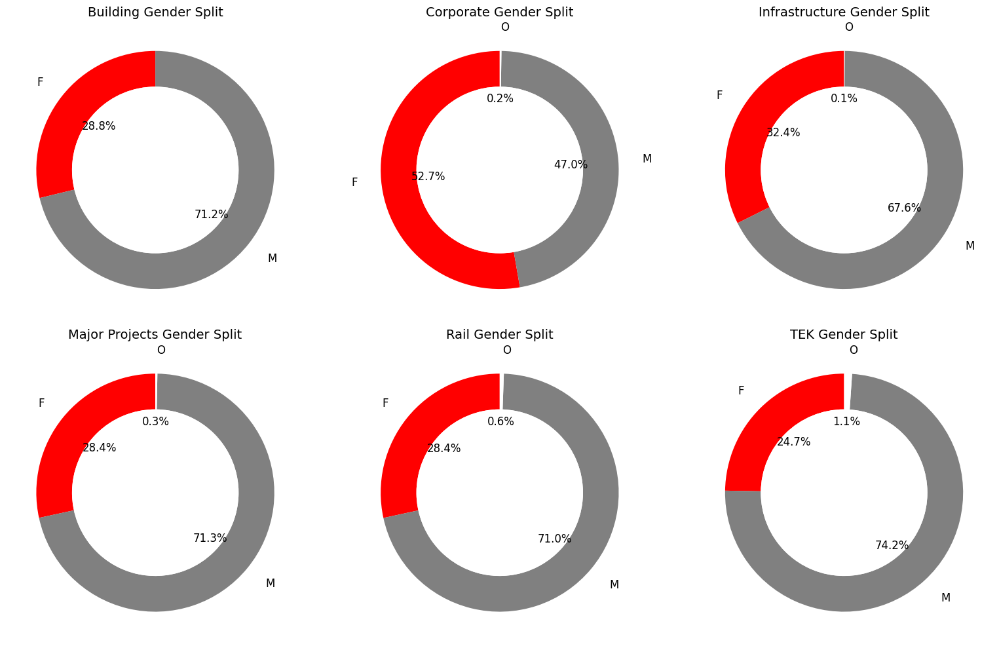

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql import functions as F
from pyspark.sql import Window

# Assuming gender_split_degree is a Spark DataFrame
# Calculate the total counts for each BU to normalize the proportions
window_spec = Window.partitionBy('BU')
gender_split_degree = gender_split_degree.withColumn('Total', F.sum('count').over(window_spec))

# Calculate the proportion for each gender within each BU
gender_split_degree = gender_split_degree.withColumn('proportion', F.col('count') / F.col('Total'))

# Convert the Spark DataFrame to Pandas for plotting
gender_split_degree_pd = gender_split_degree.toPandas()

# Get the list of unique BUs
unique_bu = gender_split_degree_pd['BU'].unique()

# Plot donut charts for each BU
fig, axes = plt.subplots(nrows=2, ncols=(len(unique_bu) + 1) // 2, figsize=(16, 10))  # Adjust layout for more BUs

# Flatten axes for easy iteration
axes = axes.flatten()

# Loop through each BU and create a donut chart
for i, bu in enumerate(unique_bu):
    bu_data = gender_split_degree_pd[gender_split_degree_pd['BU'] == bu]
    
    # Prepare data for the donut chart
    gender_counts = bu_data.groupby('Gender')['proportion'].sum()
    
    # Create the pie chart (with a hole in the middle to make it a donut chart)
    wedges, texts, autotexts = axes[i].pie(gender_counts, 
                                           labels=gender_counts.index, 
                                           autopct='%1.1f%%', 
                                           startangle=90, 
                                           colors=['red', 'grey', 'white'],  # Custom colors
                                           wedgeprops={'width': 0.3},  
                                           textprops={'fontsize': 12},
                                           labeldistance=1.2)  # Increase distance for labels
    
    # Adjust font size of percentages (autotexts)
    for autotext in autotexts:
        autotext.set_fontsize(12)  # Increase font size for percentages
        autotext.set_color('black')  # Set percentage text color to black for better visibility

    # Add a center circle for the donut effect
    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    axes[i].add_artist(centre_circle)

    # Add title to each subplot
    axes[i].set_title(f'{bu} Gender Split', fontsize=14)  # Increase title font size

# Hide any extra subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


## BU wise influential people proportion in top 1000 for different metrics

In [0]:
ranked_df_pd = ranked_df.toPandas()
display(ranked_df_pd)

Person ID,BU,Gender,JH Position Title (externalCode),External Title,Department,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Degree Centrality,Normalized Degree Centrality,Normalized Eigenvector Centrality,Normalized Closeness Centrality,Rank by Degree Centrality,Rank by Closeness Centrality,Rank by Betweenness Centrality,Rank by Eigenvector Centrality
114332,Rail,M,PDEL-RAIL-OPML,"Operations Manager NSW, QLD & New Zealand",Rail New Zealand,0.0,0.022113140990345,0.712402870847445,0.0031688546853779,0.35,1.0,0.9601786384504324,14,2,87,1
59536,Infrastructure,M,PDEL-INFR-GEMO,General Manager Infrastructure NSW/ACT/QLD,Infrastructure NSW/ACT,0.0,0.0192345416285235,0.6040912326694563,0.0036215482118605,0.4,0.8479629397766254,0.8351864622107537,12,3,87,2
54703,Major Projects,M,PDEL-INFR-PRD1B,Project Director,M7-M12 Project,0.0,0.0124101034613957,0.2918974353492506,0.0015844273426889,0.175,0.4097364669525624,0.538861315531548,21,14,87,3
22510,Rail,M,PDEL-RAIL-PRD,Alliance General Manager,North Western Program Alliance - R,0.0,0.0139593694019078,0.1712292422075994,0.0011317338162064,0.125,0.2403545089622775,0.6061322682201803,23,7,87,4
62061,Building,M,PDEL-BUILD-GEMB,General Manager Building NSW/ACT,Building NSW/ACT Operations,0.0,0.0100420597124706,0.0776221090810132,9.053870529651E-4,0.1,0.1089581643412389,0.4360380656084951,24,22,87,5
90346,Building,M,PDEL-BUILD-GEMB,General Manager Building QLD/NT,Building QLD/NT Operations,0.0,0.0118384162481703,0.0670372393242477,0.0024898143956541,0.275,0.0941001813235563,0.5140379830952417,17,17,87,6
92139,Infrastructure,M,PDEL-INFR-PRD,Project Director,Upper South Creek Advanced Water Recycling Centre,6.277463263825654E-6,0.0083555952222497,0.0308222876423316,0.0018107741059302,0.2,0.0432652490626111,0.3628097902258949,20,28,12,7
110476,Rail,M,PDEL-RAIL-PRD,Project Director,Gold Coast Light Rail Stage 3,1.0207257339553908E-5,0.0125144933476082,0.0304814327532192,0.0024898143956541,0.275,0.0427867910116096,0.5433940473969697,17,13,2,8
94457,Infrastructure,M,PDEL-INFR-GEMO,General Manager Infrastructure VIC/SA/TAS,Infrastructure VIC/SA/TAS,0.0,0.0157453544878515,0.0150310999322774,0.0049796287913082,0.55,0.0210991568747447,0.6836818451374974,7,5,87,9
88714,Major Projects,M,PDEL-INFR-CD1B,Construction Director,M7-M12 Project,4.49119322940372E-6,0.005716555125928,0.013952121575125,0.0015844273426889,0.175,0.0195845948182044,0.2482195595748709,21,36,20,10


In [0]:
import pandas as pd

# Convert Spark DataFrame to Pandas
ranked_df_pd = ranked_df.toPandas()

# Get the top 1000 employees based on Degree Centrality
top_1000_degree = ranked_df_pd.nlargest(1000, 'Rank by Eigenvector Centrality')

# Count employees in each BU
bu_counts_degree = top_1000_degree.groupby('BU').size().reset_index(name='Count')

# Display the result
print(bu_counts_degree)


               BU  Count
0        Building    124
1       Corporate     99
2  Infrastructure    243
3  Major Projects    288
4            Rail    224
5             TEK     22


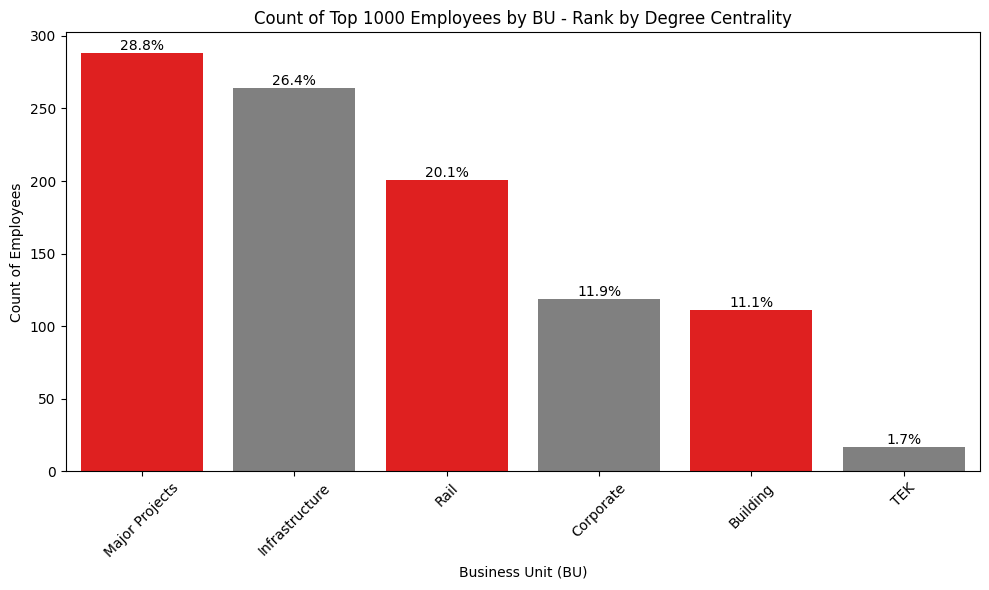

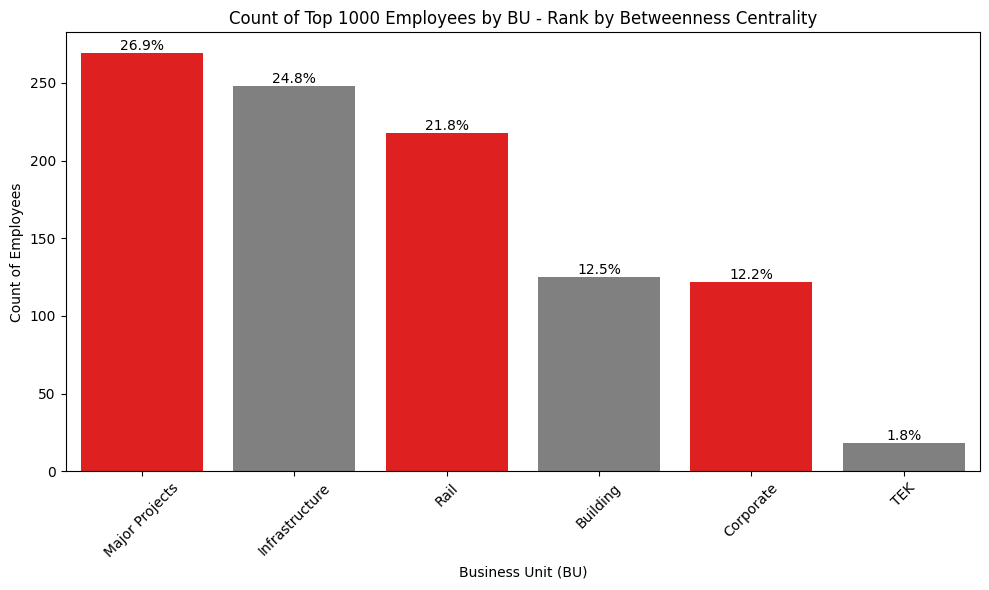

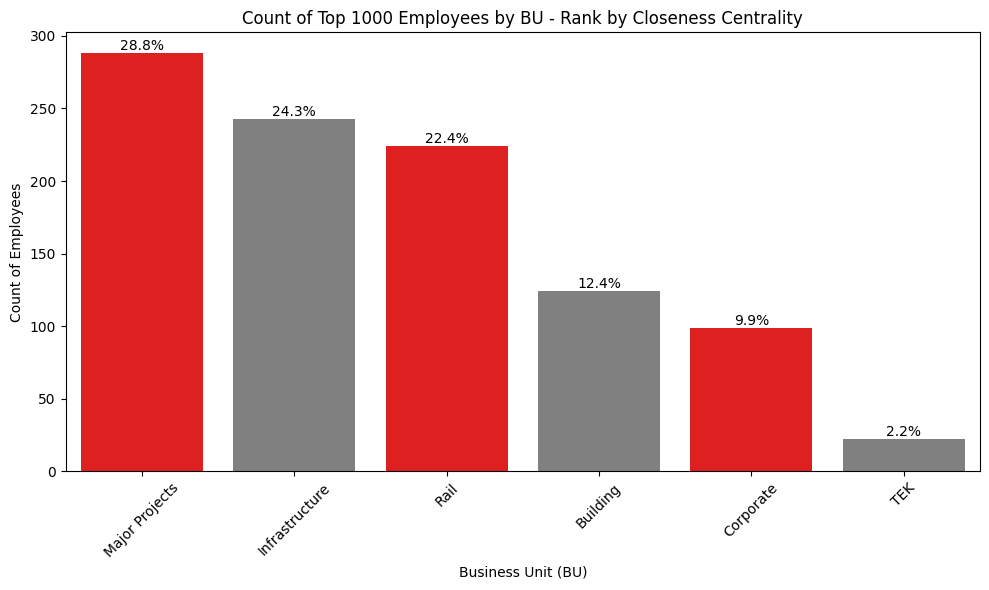

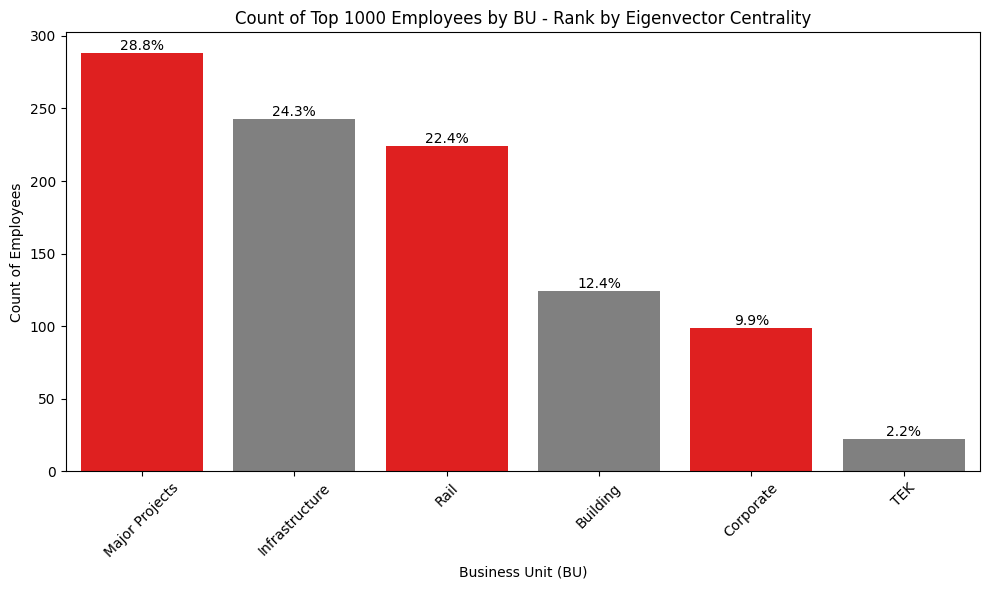

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert Spark DataFrame to Pandas if needed
ranked_df_pd = ranked_df.toPandas()

# Metrics to analyze
centrality_metrics = ['Rank by Degree Centrality', 'Rank by Betweenness Centrality', 'Rank by Closeness Centrality', 'Rank by Eigenvector Centrality']

# Initialize a dictionary to store top 1000 employees for each metric
top_1000_by_metric = {}

# For each centrality metric, rank the top 1000 employees and store them
for metric in centrality_metrics:
    top_1000_by_metric[metric] = ranked_df_pd.nlargest(1000, metric)

# Loop through each centrality metric and plot a separate graph
for metric in centrality_metrics:
    # Calculate the count of employees for each BU in the top 1000
    bu_counts = top_1000_by_metric[metric]['BU'].value_counts()
    bu_counts_df = bu_counts.reset_index()
    bu_counts_df.columns = ['BU', 'Count']

    # Calculate the total count of top 1000 employees
    total_count = bu_counts_df['Count'].sum()

    # Calculate proportions correctly
    bu_counts_df['Proportion'] = (bu_counts_df['Count'] / total_count) * 100

    # Alternate red and grey colors for the bars
    bar_colors = ['red' if i % 2 == 0 else 'grey' for i in range(len(bu_counts_df))]

    # Plot the counts using Seaborn
    plt.figure(figsize=(10, 6))
    barplot = sns.barplot(x='BU', y='Count', data=bu_counts_df, palette= bar_colors)

    # Add proportions on top of the bars
    for i, p in enumerate(barplot.patches):
        # Get the BU label from the bar's x position
        bu_label = bu_counts_df['BU'][i]
        # Get the proportion for this BU
        proportion = bu_counts_df.loc[bu_counts_df['BU'] == bu_label, 'Proportion'].values[0]
        # Add annotation
        barplot.annotate(f'{proportion:.1f}%', 
                         (p.get_x() + p.get_width() / 2., p.get_height()), 
                         ha='center', va='bottom', color='black', fontsize=10)

    plt.title(f'Count of Top 1000 Employees by BU - {metric}')
    plt.ylabel('Count of Employees')
    plt.xlabel('Business Unit (BU)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


In [0]:
distinct_job_levels = joined_df.select("Job Level").distinct()
display(distinct_job_levels)

Job Level
7
3
8
5
6
9
1
4
2


In [0]:
from pyspark.sql.functions import col

# Define a list of centrality measures
centrality_measures = [
    "Rank by Degree Centrality",
    "Rank by Betweenness Centrality",
    "Rank by Closeness Centrality",
    "Rank by Eigenvector Centrality"
]

# Loop through each centrality measure to filter, group, and calculate proportions
for centrality in centrality_measures:
    # Filter the top 1000 by each centrality measure from the Spark DataFrame 'joined_df'
    top_1000 = joined_df.orderBy(col(centrality)).limit(1000)
    
    # Group by 'Job Level' and count the number of employees in each Job Level
    job_level_counts = top_1000.groupBy("Job Level").count()
    
    # Calculate the total count of top 1000 employees
    total_count = top_1000.count()
    
    # Calculate proportions correctly
    job_level_counts = job_level_counts.withColumn("Proportion", (col("count") / total_count) * 100)
    
    # Display the DataFrame with proportions of employees in each Job Level
    display(job_level_counts)

Job Level,count,Proportion
8,57,5.7
7,175,17.5
6,412,41.199999999999996
5,248,24.8
9,2,0.2
3,25,2.5
4,62,6.2
2,9,0.8999999999999999
1,10,1.0


Job Level,count,Proportion
7,143,14.299999999999999
8,16,1.6
6,415,41.5
5,302,30.2
3,35,3.5000000000000004
4,82,8.200000000000001
2,7,0.7000000000000001


Job Level,count,Proportion
8,61,6.1
7,179,17.9
5,245,24.5
9,2,0.2
6,414,41.4
3,25,2.5
4,66,6.6000000000000005
2,8,0.8


Job Level,count,Proportion
8,61,6.1
9,2,0.2
7,179,17.9
6,414,41.4
5,245,24.5
4,66,6.6000000000000005
3,25,2.5
2,8,0.8


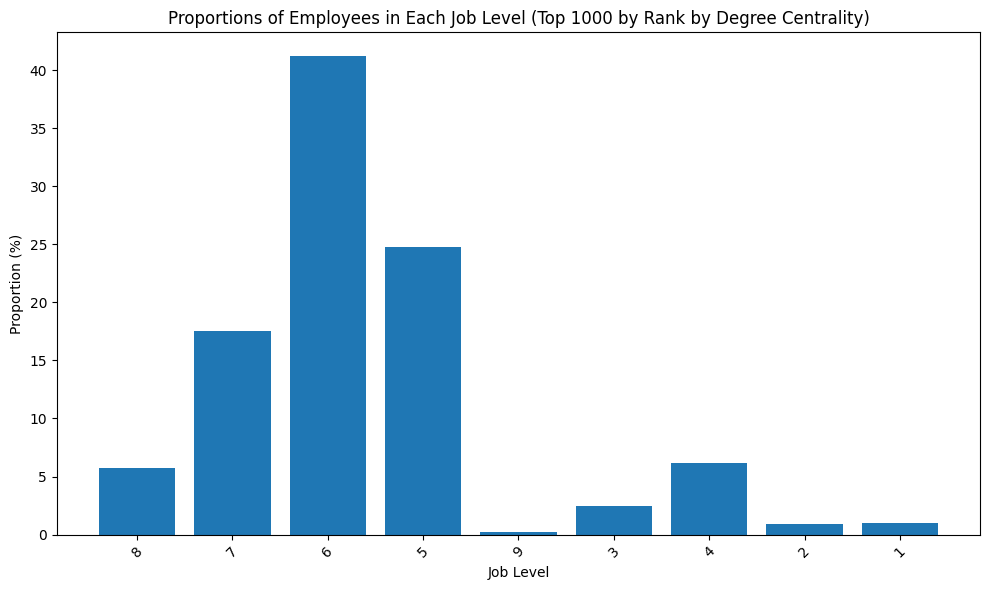

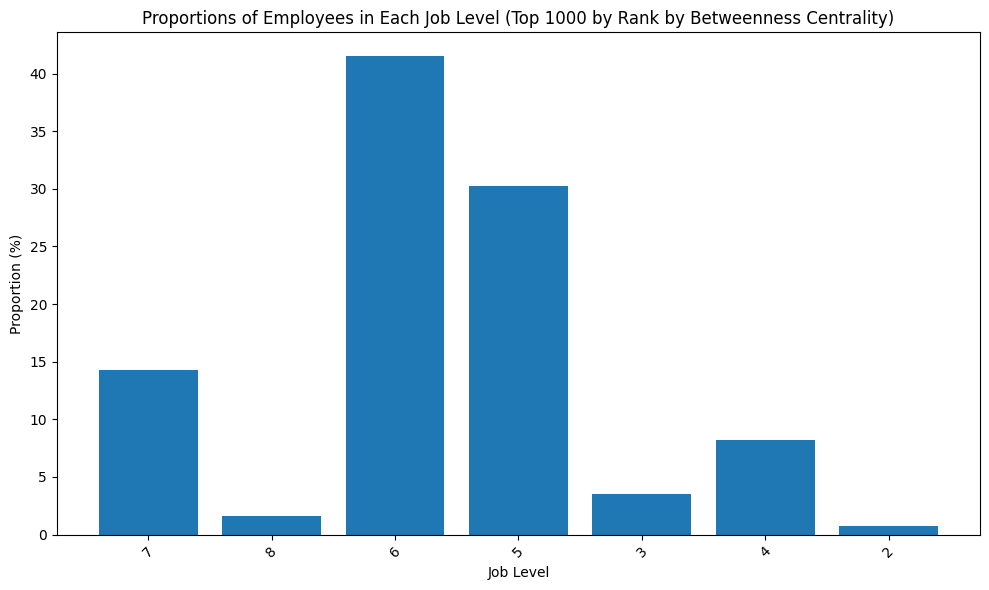

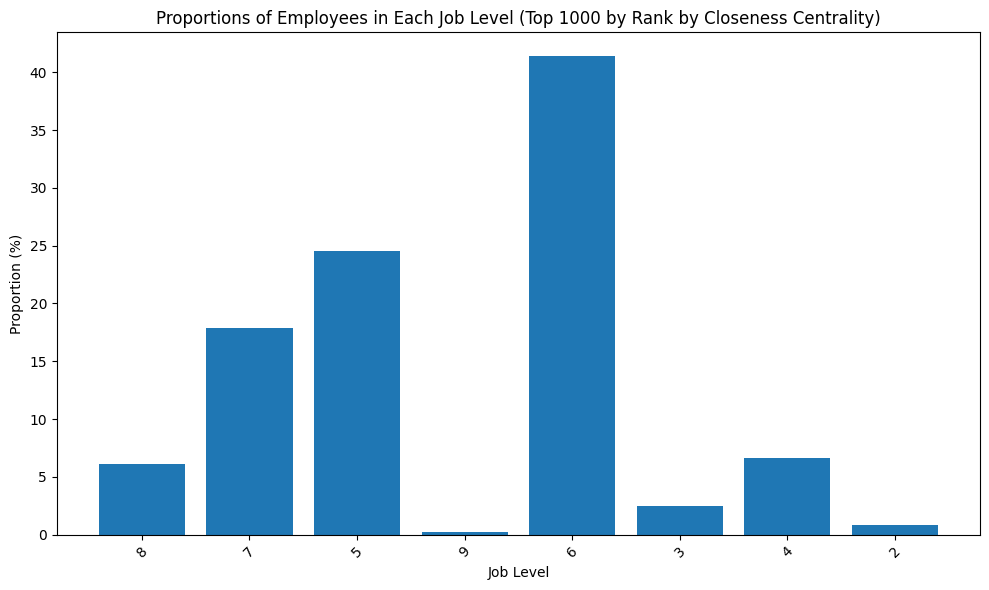

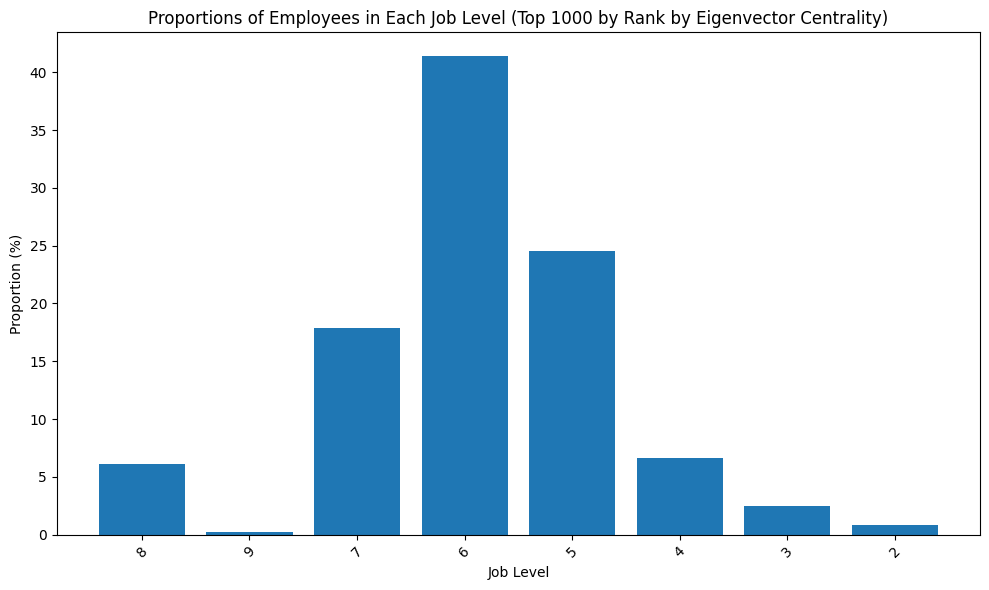

In [0]:
for centrality in centrality_measures:
    top_1000 = joined_df.orderBy(col(centrality)).limit(1000)
    job_level_counts = top_1000.groupBy("Job Level").count()
    total_count = top_1000.count()
    job_level_counts = job_level_counts.withColumn("Proportion", (col("count") / total_count) * 100)
    
    job_level_counts_pd = job_level_counts.toPandas()
    
    plt.figure(figsize=(10, 6))
    plt.bar(job_level_counts_pd['Job Level'], job_level_counts_pd['Proportion'])
    plt.xlabel('Job Level')
    plt.ylabel('Proportion (%)')
    plt.title(f'Proportions of Employees in Each Job Level (Top 1000 by {centrality})')
    plt.xticks(rotation=45)
    plt.tight_layout()
    display()  # Use display() for Databricks notebooks to show matplotlib plots

In [0]:
distinct_age_groups = joined_df.select("Age Group").distinct()
display(distinct_age_groups)

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-2428332936186400>, line 2
      1 distinct_age_groups = joined_df.select("Age Group").distinct()
----> 2 display(distinct_age_groups)

File /databricks/python_shell/dbruntime/display.py:210, in Display.display(self, input, *args, **kwargs)
    208         self.display_connect_table(input)
    209 elif isinstance(input, ConnectDataFrame):
--> 210     if getattr(input, "isStreaming", False):
    211         handleStreamingConnectDataFrame(input, self.entry_point, kwargs)
    212     else:

File /usr/lib/python3.10/functools.py:981, in cached_property.__get__(self, instance, owner)
    979 val = cache.get(self.attrname, _NOT_FOUND)
    980 if val is _NOT_FOUND:
--> 981     val = self.func(instance)
    982     try:
    983         cache[self.attrname] = val

File /databricks/spark/python/pyspark/sql/connect/dataframe.py:1903,

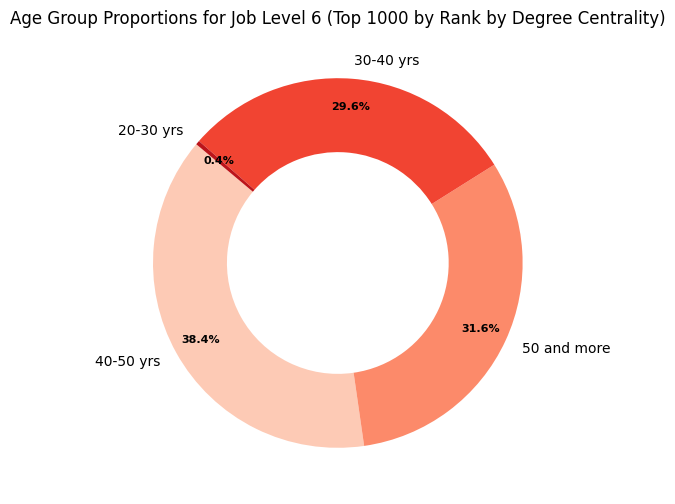

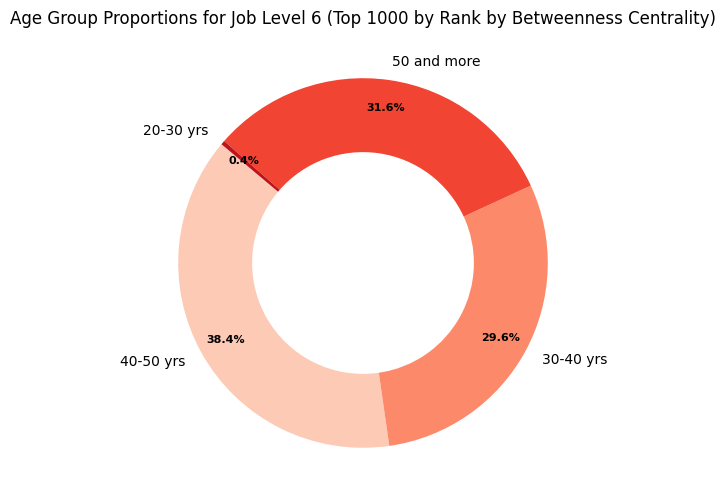

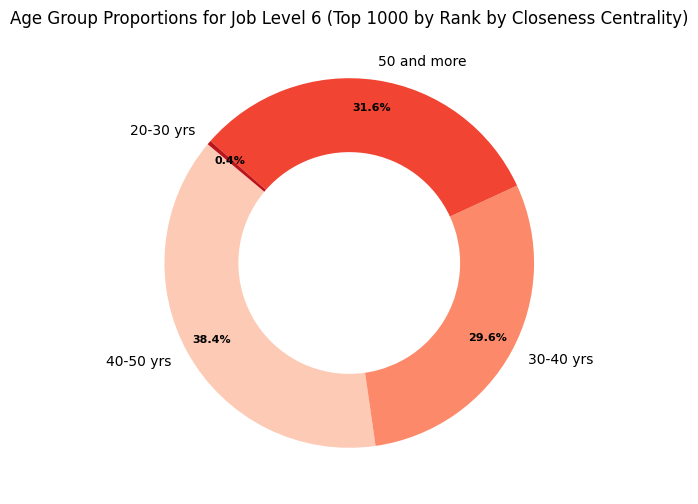

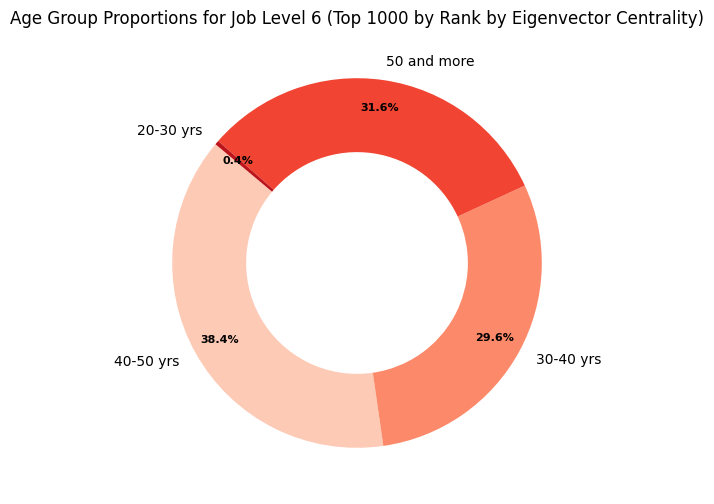

In [0]:
 # Ensure NumPy is installed in your Databricks environment

import numpy as np  # Import NumPy and alias it as np

# Define a list of centrality measures
centrality_measures = [
    "Rank by Degree Centrality",
    "Rank by Betweenness Centrality",
    "Rank by Closeness Centrality",
    "Rank by Eigenvector Centrality"
]

for centrality in centrality_measures:
    top_1000 = joined_df.filter(col("Job Level") == "6").orderBy(col(centrality), ascending=False).limit(1000)
    age_group_counts = top_1000.groupBy("Age (Group)").count()
    total_count = top_1000.count()
    age_group_counts = age_group_counts.withColumn("Proportion", (col("count") / total_count) * 100)
    
    age_group_counts_pd = age_group_counts.toPandas()
    
    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw=dict(aspect="equal"))
    wedges, texts, autotexts = ax.pie(age_group_counts_pd['Proportion'], labels=age_group_counts_pd['Age (Group)'], autopct='%1.1f%%', startangle=140, pctdistance=0.85, colors=[plt.cm.Reds(i) for i in np.linspace(0.2, 0.8, len(age_group_counts_pd))], wedgeprops=dict(width=0.4))
    plt.setp(autotexts, size=8, weight="bold")
    ax.set_title(f'Age Group Proportions for Job Level 6 (Top 1000 by {centrality})')
    display()  # Display each plot in Databricks cell output

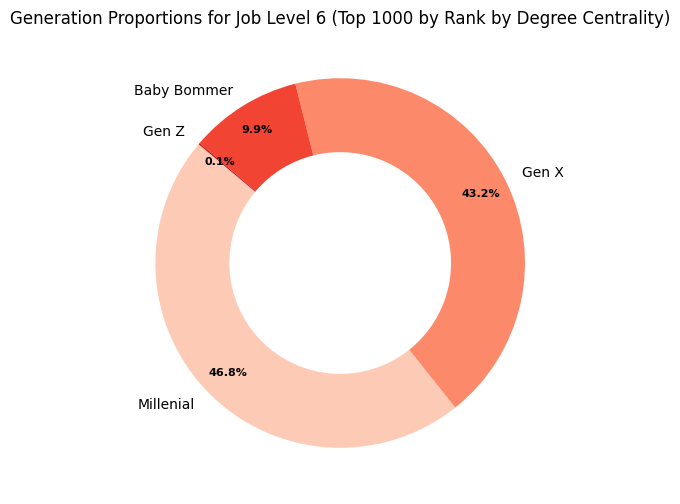

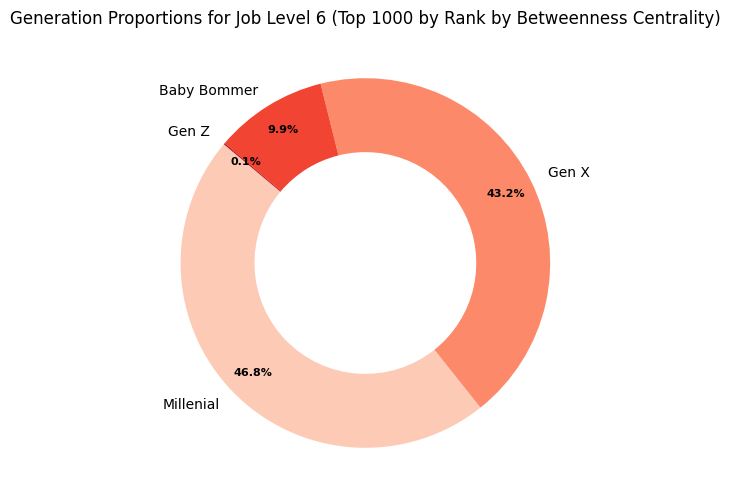

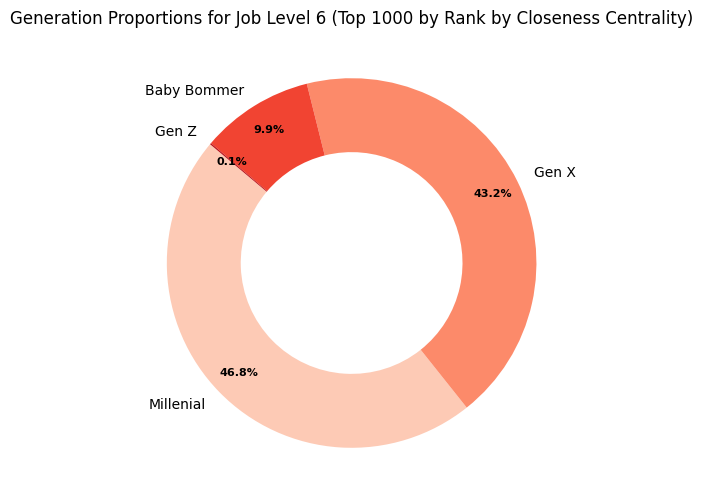

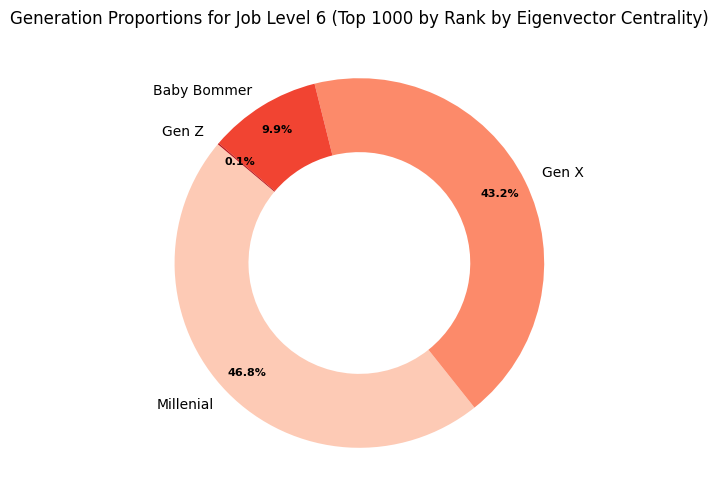

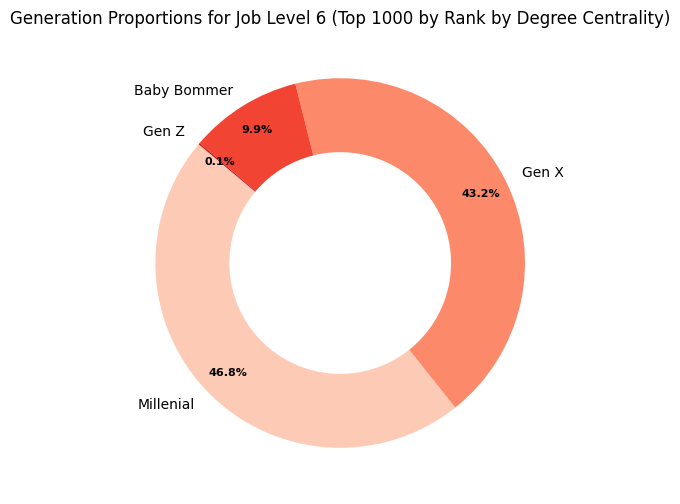

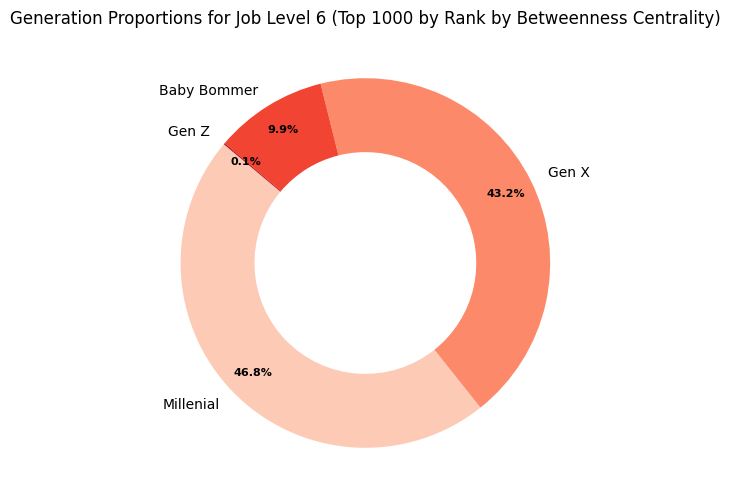

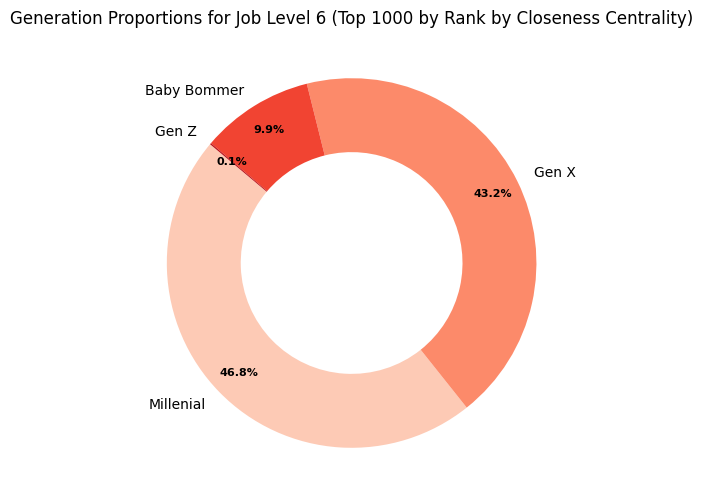

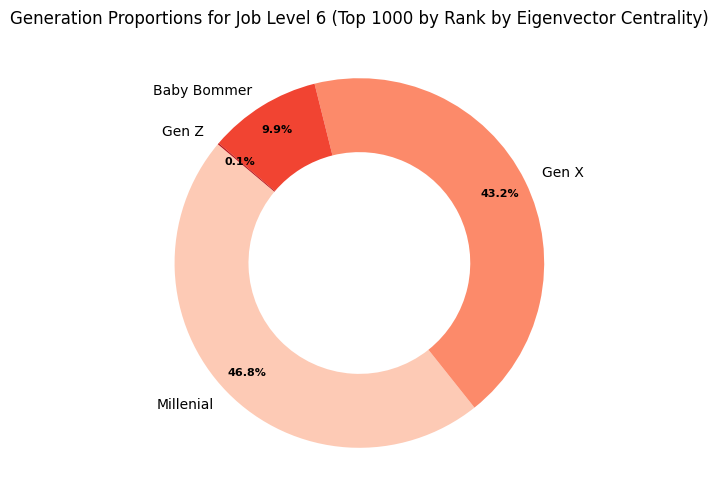

In [0]:
from pyspark.sql.functions import col, lit
import matplotlib.pyplot as plt
import numpy as np

# Define a list of centrality measures
centrality_measures = [
    "Rank by Degree Centrality",
    "Rank by Betweenness Centrality",
    "Rank by Closeness Centrality",
    "Rank by Eigenvector Centrality"
]

for centrality in centrality_measures:
    top_1000 = joined_df.filter(col("Job Level") == "6").orderBy(col(centrality), ascending=False).limit(1000)
    generation_counts = top_1000.groupBy("Generation").count()
    total_count = top_1000.count()
    generation_counts = generation_counts.withColumn("Proportion", (col("count") / lit(total_count)) * 100)
    
    generation_counts_pd = generation_counts.toPandas()
    
    # Plotting
    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw=dict(aspect="equal"))
    wedges, texts, autotexts = ax.pie(generation_counts_pd['Proportion'], labels=generation_counts_pd['Generation'], autopct='%1.1f%%', startangle=140, pctdistance=0.85, colors=[plt.cm.Reds(i) for i in np.linspace(0.2, 0.8, len(generation_counts_pd))], wedgeprops=dict(width=0.4))
    plt.setp(autotexts, size=8, weight="bold")
    ax.set_title(f'Generation Proportions for Job Level 6 (Top 1000 by {centrality})')
    display(fig)  # Display each plot in Databricks cell output